In [1]:
from glob import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import seaborn as sns
import os
import re
from kneed import KneeLocator
import pickle

from tslearn.preprocessing import TimeSeriesScalerMeanVariance, TimeSeriesScalerMinMax, TimeSeriesResampler
from tslearn.clustering import TimeSeriesKMeans, KShape, KernelKMeans
from tslearn.utils import to_time_series_dataset
from dtaidistance import dtw, clustering
from tslearn.neighbors import KNeighborsTimeSeriesClassifier
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


from scipy.cluster.hierarchy import dendrogram, linkage

In [2]:
def get_file_paths(directory, extensions=['.csv', '.CSV', '.xlsx']):
    file_paths = []
    # Iterate over each extension
    for ext in extensions:
        # Use glob to find all files with the given extension in the directory and subdirectories
        file_paths.extend(glob(os.path.join(directory, '**', f'*{ext}'), recursive=True))
    return file_paths

# Specify the root directory
root_directory = os.path.join('logs', 'selected')

# Get the list of file paths
file_paths = get_file_paths(root_directory)
print(f'Found {len(file_paths)} log files.')

Found 47 log files.


In [3]:
column_patterns = {
    'Time (s)': r'Time.*s',
    'Motor Speed (RPM)': r'Motor.*RPM',
    'Engine Speed (RPM)': r'Engine.*Speed.*RPM',
    'Throttle (%)': r'Throttle.*%',
    'Intake Temperature (C)': r'\s*Intake\s*Temp(?:erature)?\s*\(\s*C\s*\)',
    'Engine Coolant Temperature 1 (C)': r'\s*Engine\s*Coolant\s*(?:Temperature|Temp)\s*1?\s*\(\s*C\s*\)',
    'Engine Coolant Temperature 2 (C)': r'\s*Engine\s*Coolant\s*(?:Temperature|Temp)\s*2?\s*\(\s*C\s*\)',
    'Barometric Pressure (kpa)': r'Barometric.*Pressure.*kpa',
    'Fuel Trim': r'Fuel.*Trim',
    'Fuel Consumption (g/min)': r'Fuel.*Consumption.*g.*min',
    'Fuel Consumed (g)': r'Fuel.*Consumed.*g',
    # 'Expected Max Power (W)': r'Expected.*Max.*Power.*W',
    'Bus Voltage (V)': r'Bus.*Voltage.*V',
    'Battery Current (A)': r'Battery.*Current.*A',
    'Power Generated (W)': r'Power.*Generated.*W',
    'Inverter Temperature (C)': r'\s*Inverter\s*(?:Temperature|MAX)\s*\(\s*C\s*\)',
    'Target Fuel Pressure (bar)': r'Target.*Fuel.*Pressure.*bar',
    'Fuel Pressure (bar)': r'Fuel.*Pressure.*bar',
    'Fuel Pump Speed (RPM)': r'Fuel.*Pump.*Speed.*RPM',
    'Cooling Pump Speed (RPM)': r'Cooling.*Pump.*Speed.*RPM',
}

def standardize_columns(df, column_patterns):
    standardized_columns = {}
    for standard_col, pattern in column_patterns.items():
        for col in df.columns:
            if re.match(pattern, col, re.IGNORECASE):
                standardized_columns[col] = standard_col
                break
    df = df.rename(columns=standardized_columns)
    
    return df[list(column_patterns.keys())]

def preprocess(df) :
    df = df.copy()
    df = standardize_columns(df, column_patterns)
    # if df['Throttle (%)'].max() < 80 :
    #     return None
    reference_date = pd.to_datetime('1970-01-01')
    df['Time (s)'] = reference_date + pd.to_timedelta(df['Time (s)'], unit='s')
    df = df.set_index('Time (s)')
    df = df.dropna()
    # df = df.resample('1S').mean()
    return df

def create_time_series_features(df) :
    df = df.copy()
    df['hour'] = df.index.hour
    df['minute'] = df.index.minute
    df['second'] = df.index.second
    df['microsecond'] = df.index.microsecond
    return df

In [4]:
timeseries_cat = {}
i = 1
for x in file_paths :
    if os.path.basename(os.path.dirname(x)) == '-1' :
        timeseries_cat[x] = i
        i += 1

In [5]:
timeseries_cat

{'logs\\selected\\-1\\ECU_Wiped.CSV': 5,
 'logs\\selected\\-1\\Fuel Vaporization inside Fuel Chamber.csv': 6,
 'logs\\selected\\-1\\LOG-Fuel Filter on Injector Clogging_60min_flight+7min_failure_flight.csv': 7,
 'logs\\selected\\-1\\LOG0009_1hr47min_InjectorClogged.csv': 8,
 'logs\\selected\\-1\\50 throttle not enough power(annotated).xlsx': 9}

In [6]:
shortened_label = {
    0: 'Normal',
    1: 'ECU-Wiped',
    2: 'FuelVaporization',
    3: 'InjectorClogging',
    4: 'InjectorClogging',
    5: 'NotEnoughPower'
}

In [7]:
time_series_data = []
categories = []
# file_paths_considered = []

for x in file_paths :
    if len(time_series_data) >= 200 :
        break
    if x.lower().endswith('.csv') :
        df = preprocess(pd.read_csv(x))
    else :
        df = preprocess(pd.read_excel(x))
    if df is not None:
        # file_paths_considered.append(x)
        category = timeseries_cat[x] if x in timeseries_cat else 0
        categories.append(category)
        time_series_data.append(df.values)

In [5]:
# std_scaler = StandardScaler()
# mask = np.ones(time_series_data[0].shape[1], dtype=bool)
# mask[2] = False
# X_scaled = std_scaler.fit_transform(time_series_data[0][:, mask])

In [6]:
# # Applying PCA
# pca = PCA(n_components=0.95)  # Retain 95% of the variance
# X_pca = pca.fit_transform(X_scaled)

In [7]:
# X_pca.shape

In [8]:
# # Explained variance
# explained_variance = pca.explained_variance_ratio_
# explained_variance.sum()

In [9]:
# # Plot explained variance
# plt.figure(figsize=(7, 4))
# plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.5, align='center', label='Individual explained variance')
# plt.step(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, where='mid', label='Cumulative explained variance')
# plt.ylabel('Explained variance ratio')
# plt.xlabel('Principal component index')
# plt.legend(loc='best')
# plt.title('Explained Variance by Principal Components')
# plt.show()

In [8]:
X = to_time_series_dataset(time_series_data)
X.shape

(24, 29909, 19)

In [114]:
time_series_resampler = TimeSeriesResampler(sz=5000)
X_resampled = time_series_resampler.fit_transform(X)
X_resampled.shape

(24, 5000, 19)

In [115]:
time_series_scaler_minmax = TimeSeriesScalerMinMax()
X_scaled = time_series_scaler_minmax.fit_transform(X_resampled)
X_scaled.shape

(24, 5000, 19)

In [116]:
# Save the resampler and scaler using pickle
with open('time_series_resampler.pkl', 'wb') as f:
    pickle.dump(time_series_resampler, f)

with open('time_series_scaler_minmax.pkl', 'wb') as f:
    pickle.dump(time_series_scaler_minmax, f)

Clusters 2, Inertia : 2888.425682865354
Clusters 3, Inertia : 2113.8557464233177
Clusters 4, Inertia : 1436.530682037338
Clusters 5, Inertia : 1266.8040245503275
Clusters 6, Inertia : 1201.112135323895
Clusters 7, Inertia : 1070.324291316181
Clusters 8, Inertia : 954.7753403107803
Clusters 9, Inertia : 830.5869331372356


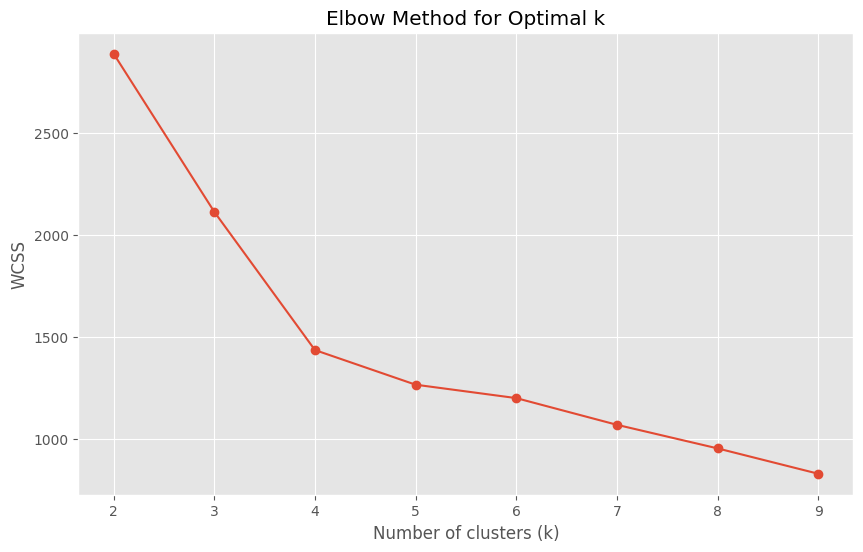

In [11]:
wcss = []
k_values = range(2, 10)  # Adjust the range as needed
models = []

for k in k_values:
    model = TimeSeriesKMeans(n_clusters=k, metric="dtw", verbose=0, random_state=0)
    model.fit(X_scaled)
    models.append(model)
    print(f'Clusters {k}, Inertia : {model.inertia_}')
    wcss.append(model.inertia_)

# Plotting the Elbow Method graph
plt.figure(figsize=(10, 6))
plt.plot(k_values, wcss, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of clusters (k)')
plt.ylabel('WCSS')
plt.show()

In [13]:
# Automatically find the "elbow" point
kneedle = KneeLocator(k_values, wcss, curve='convex', direction='decreasing')
n_clusters = kneedle.elbow

print(f'The optimal number of clusters is: {n_clusters}')

The optimal number of clusters is: 4


In [118]:
for idx, k in enumerate(models) :
    with open(f'timeseries_kmeans_model_cluster{idx+2}.pkl', 'wb') as f:
        pickle.dump(k, f)

In [57]:
# To load the model back
# with open('timeseries_kmeans_model.pkl', 'rb') as f:
#     model = pickle.load(f)

In [176]:
n_clusters=4
model = models[n_clusters-2]

In [177]:
# Step 3: Get cluster labels
cluster_labels = model.labels_

In [178]:
# Reshape X for silhouette score calculation
X_reshaped = X_scaled.reshape(X.shape[0], -1)

# Compute the silhouette score for each sample
silhouette_vals = silhouette_samples(X_reshaped, cluster_labels)

# Compute the overall silhouette score
overall_silhouette_score = silhouette_score(X_reshaped, cluster_labels)
print(f'Overall Silhouette Score: {overall_silhouette_score}')

Overall Silhouette Score: 0.1796342605526752


In [187]:
def get_top_series_per_cluster(X, labels, silhouette_vals, top_n=5):
    top_series_indices = []
    for cluster in range(n_clusters):
        # Get indices of samples in the current cluster
        cluster_indices = np.where(labels == cluster)[0]
        # Get silhouette scores for these samples
        cluster_silhouette_vals = silhouette_vals[cluster_indices]
        # Get indices of the top_n samples with the highest silhouette scores
        top_indices = cluster_indices[np.argsort(cluster_silhouette_vals)[-top_n:]]
        top_series_indices.append(top_indices)
    return top_series_indices

top_series_indices = get_top_series_per_cluster(X_scaled, cluster_labels, silhouette_vals, top_n=10)

In [188]:
def plot_clusters_for_column(X, labels, n_clusters, column_index, top_series_indices, model):
    plt.figure(figsize=(15, 10))
    for cluster in range(n_clusters):
        plt.subplot(n_clusters, 1, cluster + 1)
        for idx in top_series_indices[cluster]:
            plt.plot(X[idx, :, column_index].flatten(), "k-", alpha=0.5)
            category = categories[idx]
            if category != 0:
                # Get the shortened label from the dictionary
                label_text = shortened_label.get(category, 'Normal')
                # Annotate the plot
                if label_text != 'Normal' :
                    plt.text(len(X[idx, :, column_index].flatten()) - 1, 
                             X[idx, -1, column_index], 
                             label_text, 
                             fontsize=9, 
                             color='black')
            
        if column_index != 2 :
            plt.plot(model.cluster_centers_[cluster, :, 2].flatten(), "g-", linewidth=2, label='Throttle', alpha=0.8)
        plt.plot(model.cluster_centers_[cluster, :, column_index].flatten(), "r-", linewidth=2, label='Centroid')
        if column_index != 2 :
            plt.legend()
        plt.title(f"Cluster {cluster + 1} for {list(column_patterns.keys())[column_index + 1]}")
        
    plt.tight_layout()
    plt.show()


In [189]:
cluster_df = pd.DataFrame(cluster_labels, columns=['Cluster'])
cluster_df.Cluster.value_counts()

Cluster
0    11
2     7
1     5
3     1
Name: count, dtype: int64

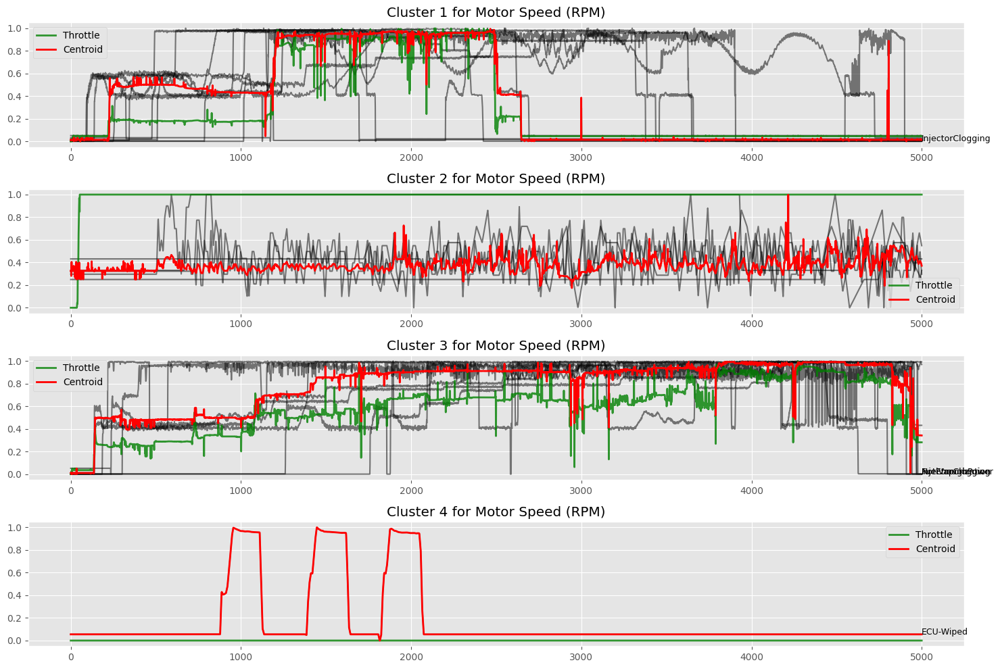

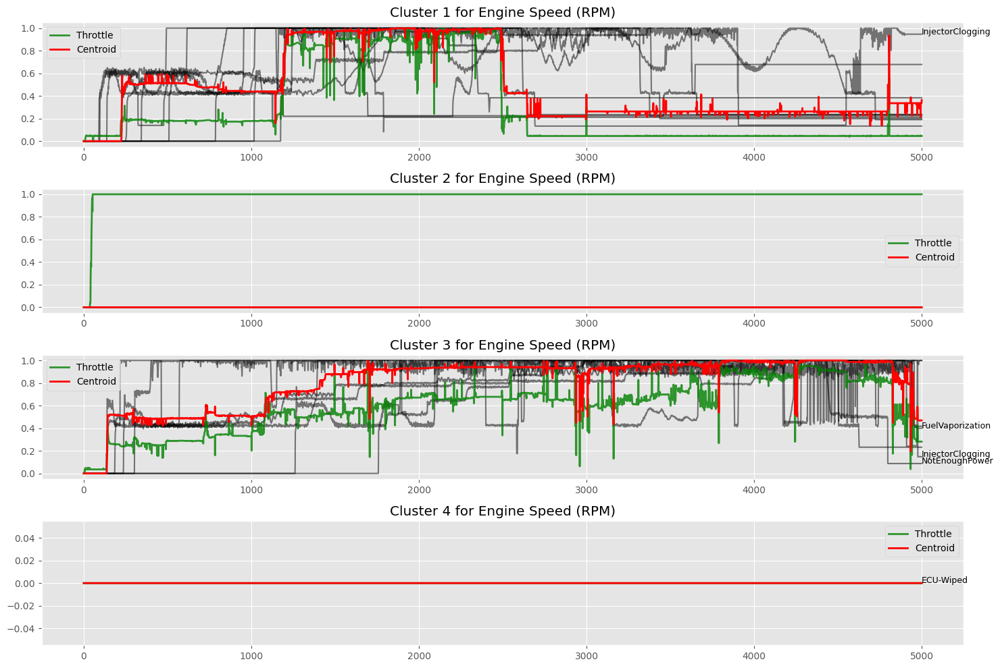

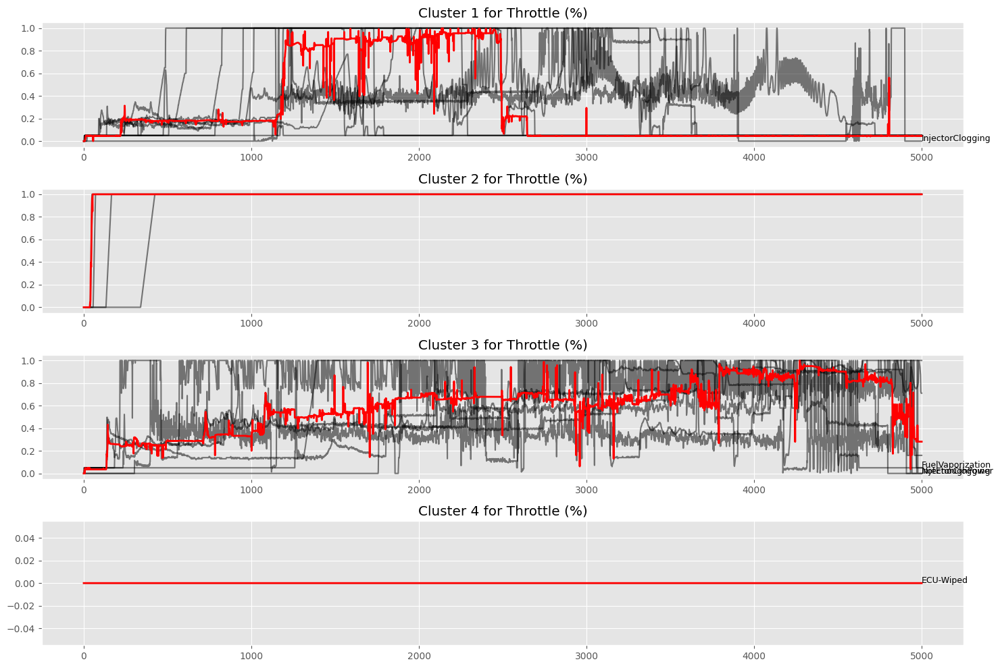

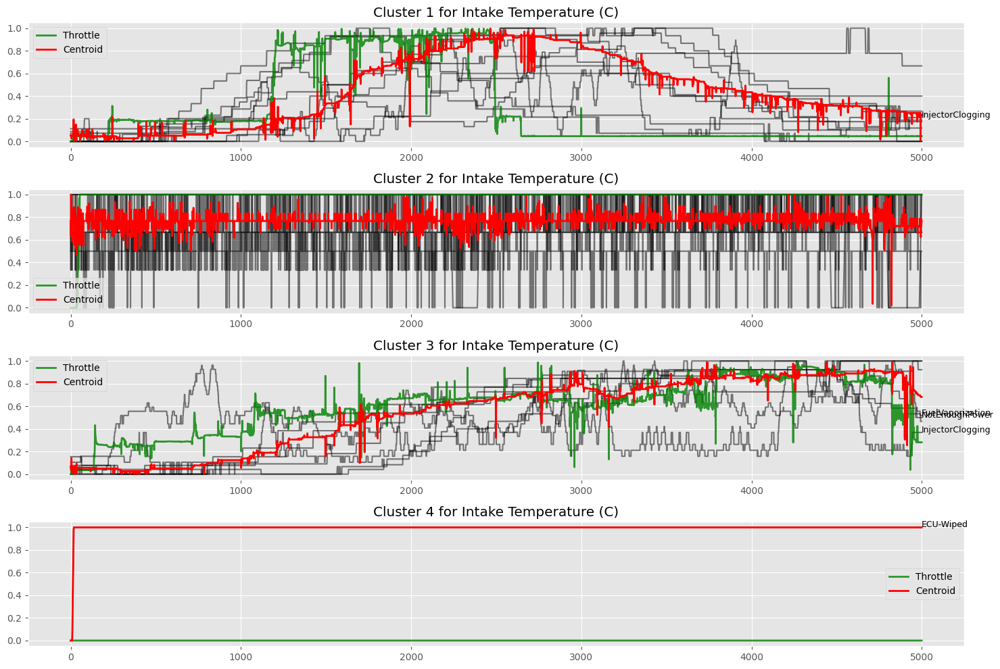

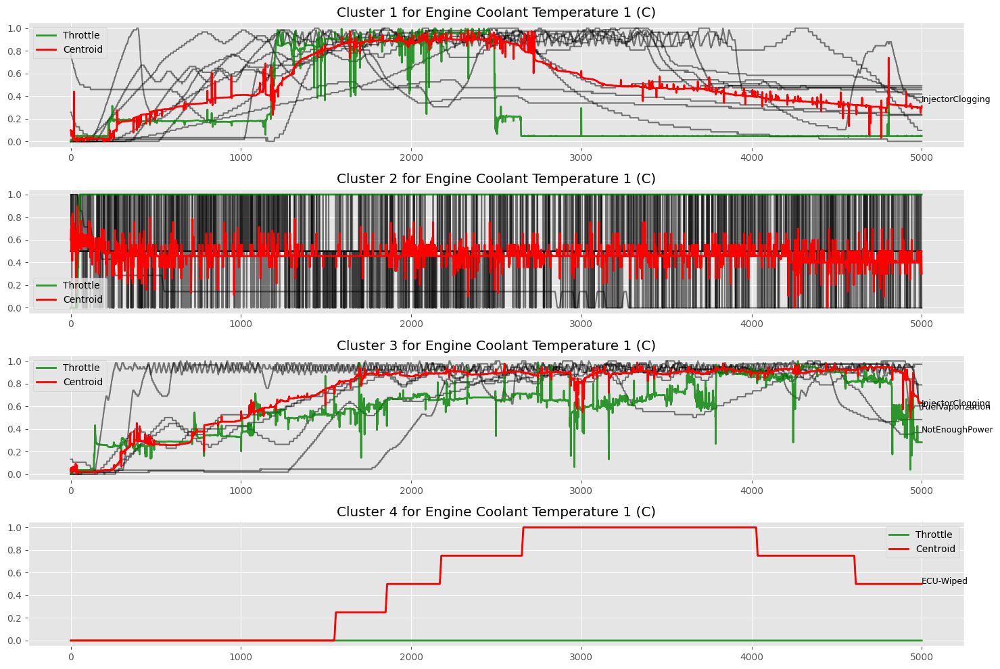

...

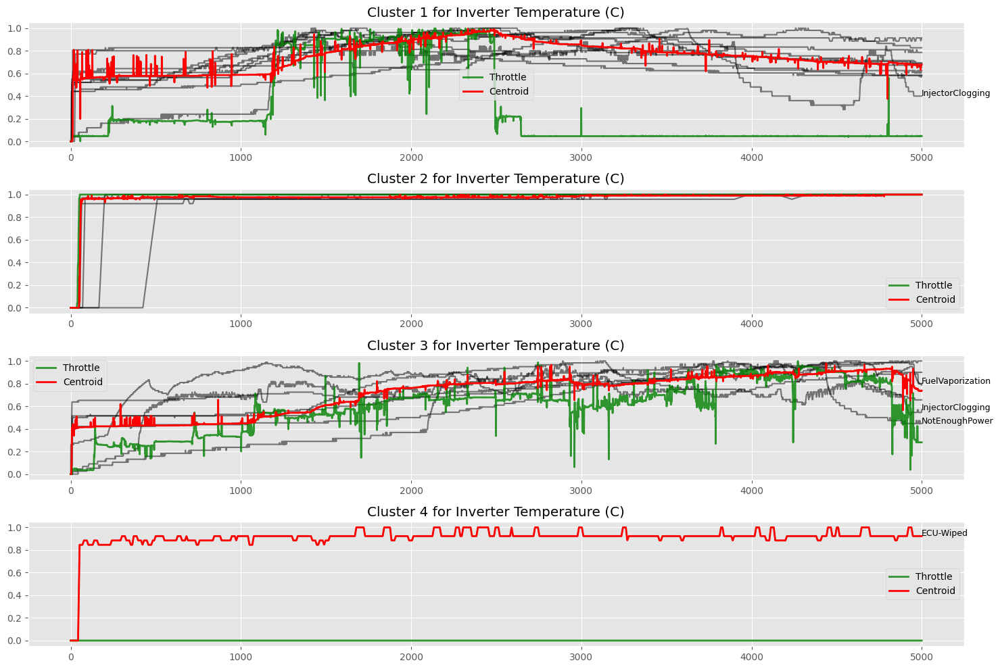

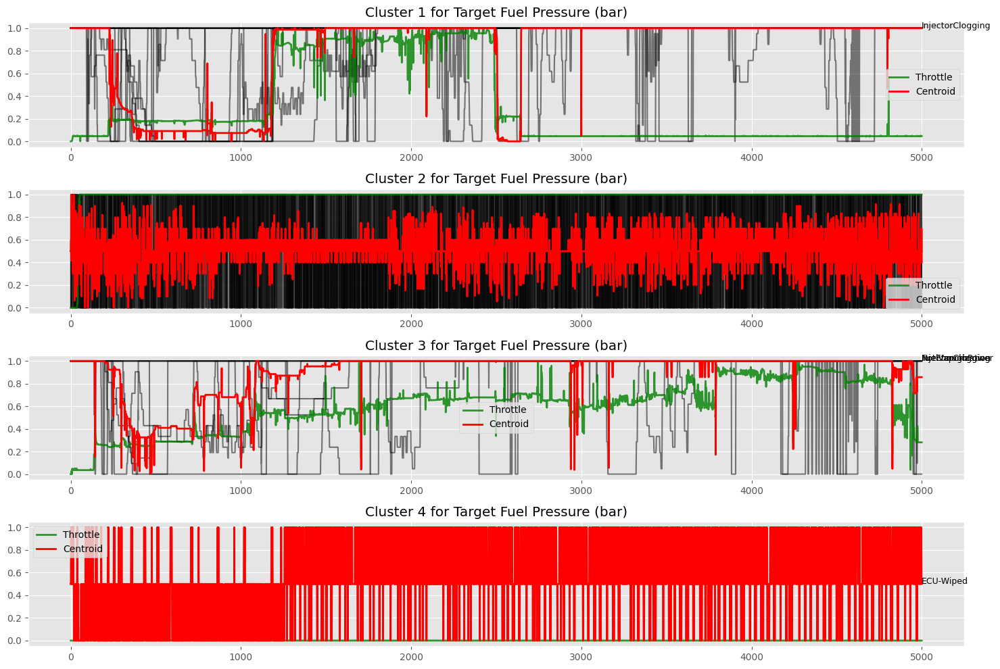

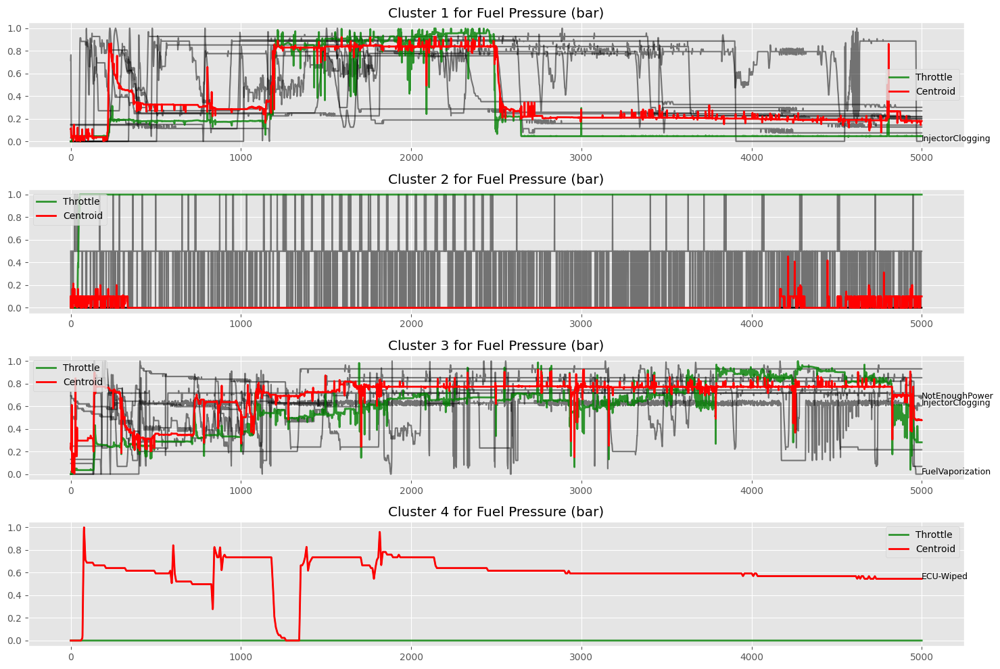

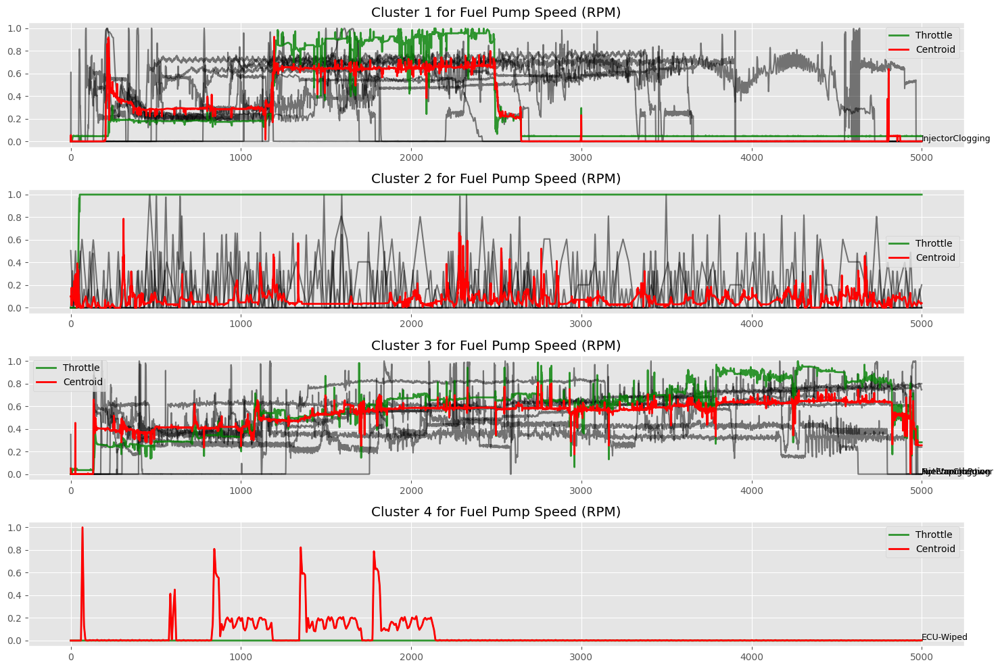

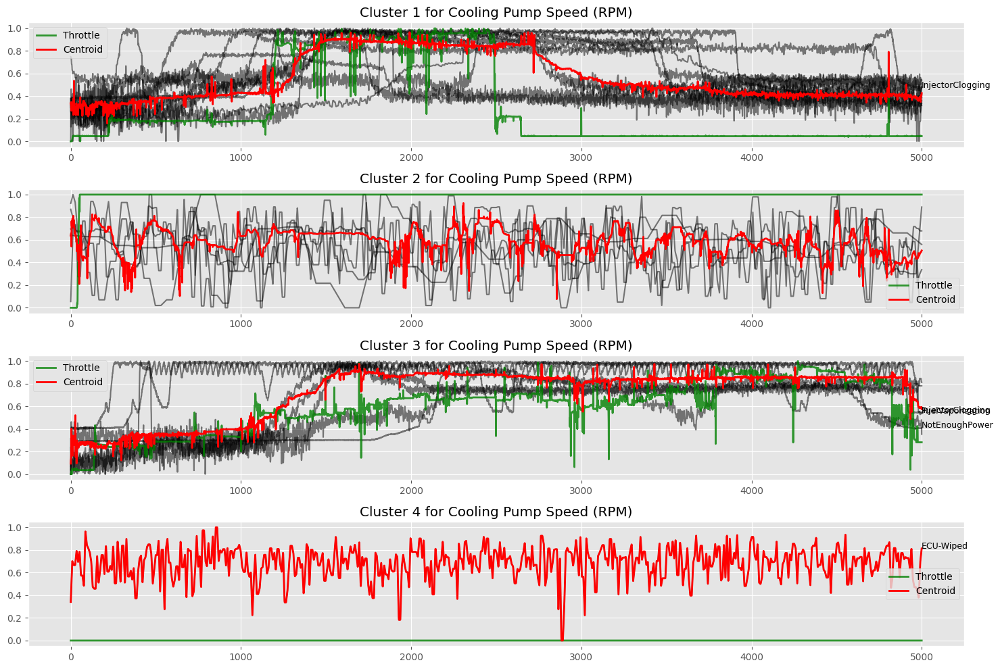

In [190]:
num_columns = X_scaled.shape[2]
for col in range(num_columns):
    plot_clusters_for_column(X_scaled, cluster_labels, n_clusters, col, top_series_indices, model)

In [34]:
## KShape
## KernelKMeans

In [199]:
model_kshape = KShape(n_clusters=2, verbose=True, random_state=0)
model_kshape.fit(X_scaled)

0.494 --> Resumed because of empty cluster
0.397 --> 0.302 --> 0.296 --> 0.304 --> 


KShape(n_clusters=2, random_state=0, verbose=True)

In [200]:
with open('kshape_model.pkl', 'wb') as f:
    pickle.dump(model_kshape, f)

In [201]:
cluster_labels_kshape = model_kshape.labels_

In [202]:
# Reshape X for silhouette score calculation
X_reshaped = X_scaled.reshape(X.shape[0], -1)

# Compute the silhouette score for each sample
silhouette_vals_kshape = silhouette_samples(X_reshaped, cluster_labels_kshape)

# Compute the overall silhouette score
overall_silhouette_score_kshape = silhouette_score(X_reshaped, cluster_labels_kshape)
print(f'Overall Silhouette Score: {overall_silhouette_score_kshape}')

Overall Silhouette Score: 0.10111217851460508


In [203]:
top_series_indices_kshape = get_top_series_per_cluster(X_scaled, cluster_labels_kshape, silhouette_vals_kshape, top_n=10)

In [204]:
cluster_df = pd.DataFrame(cluster_labels_kshape, columns=['Cluster'])
cluster_df.Cluster.value_counts()

Cluster
0    19
1     5
Name: count, dtype: int64

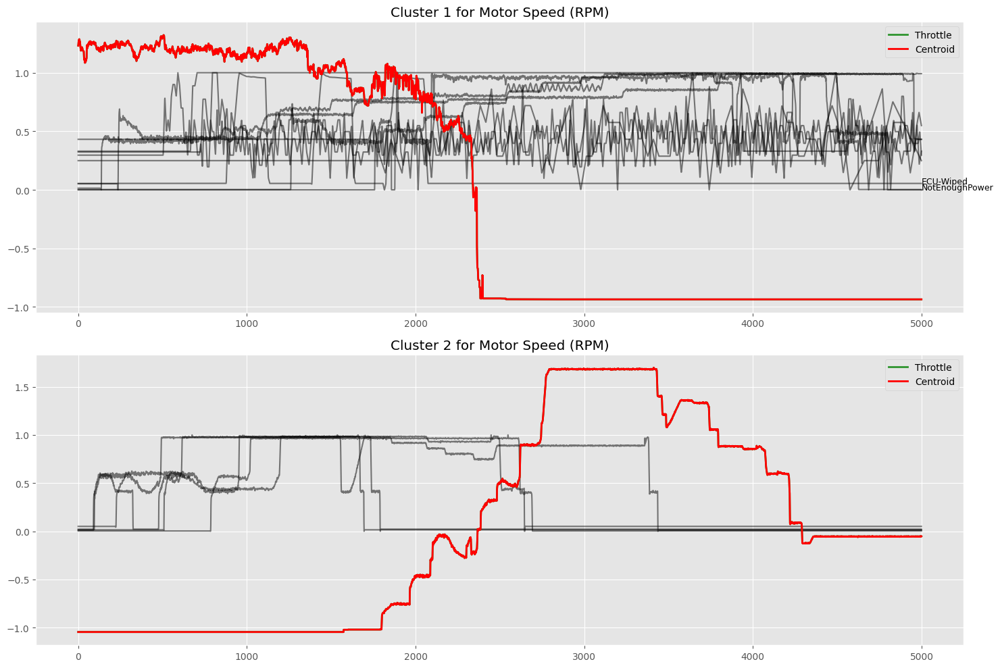

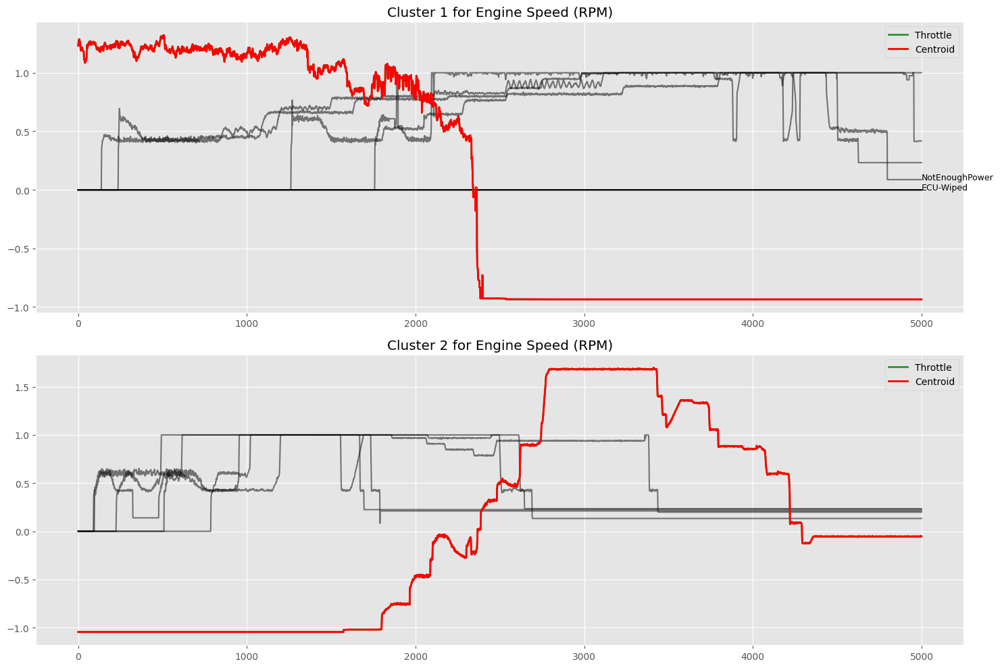

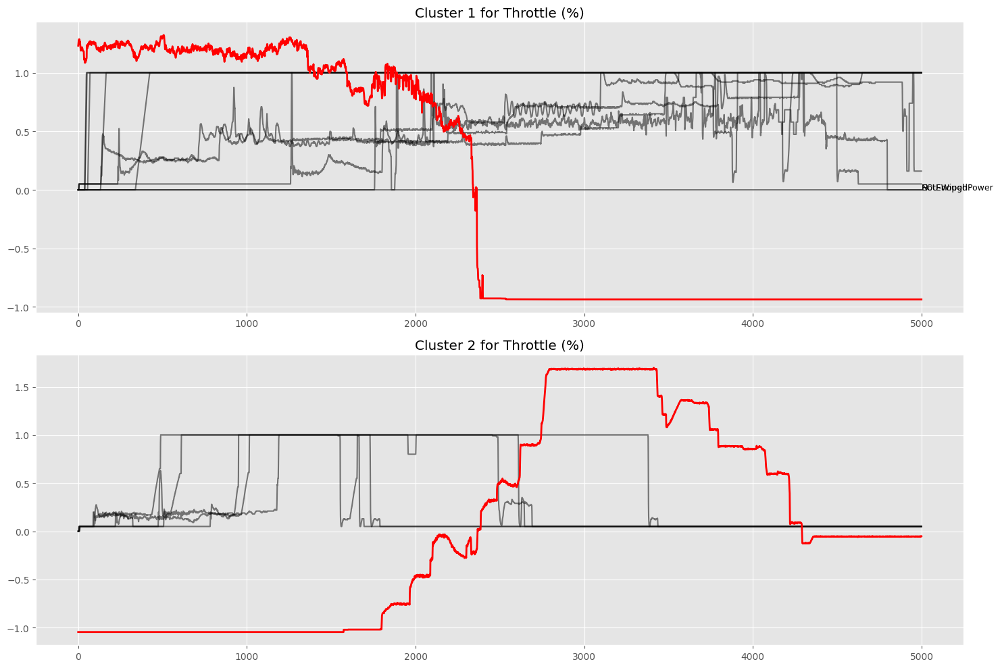

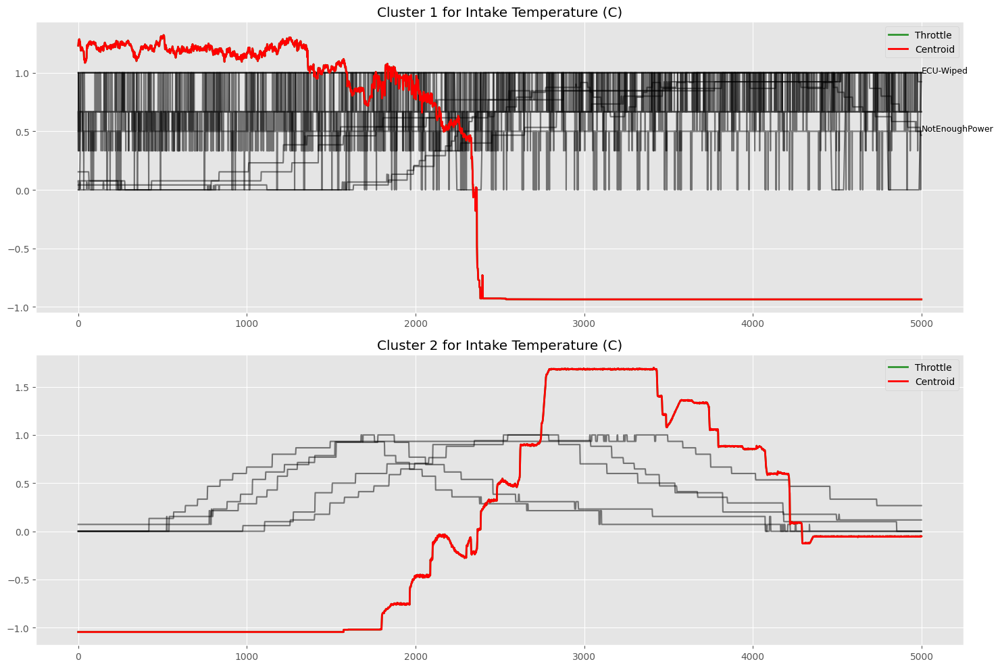

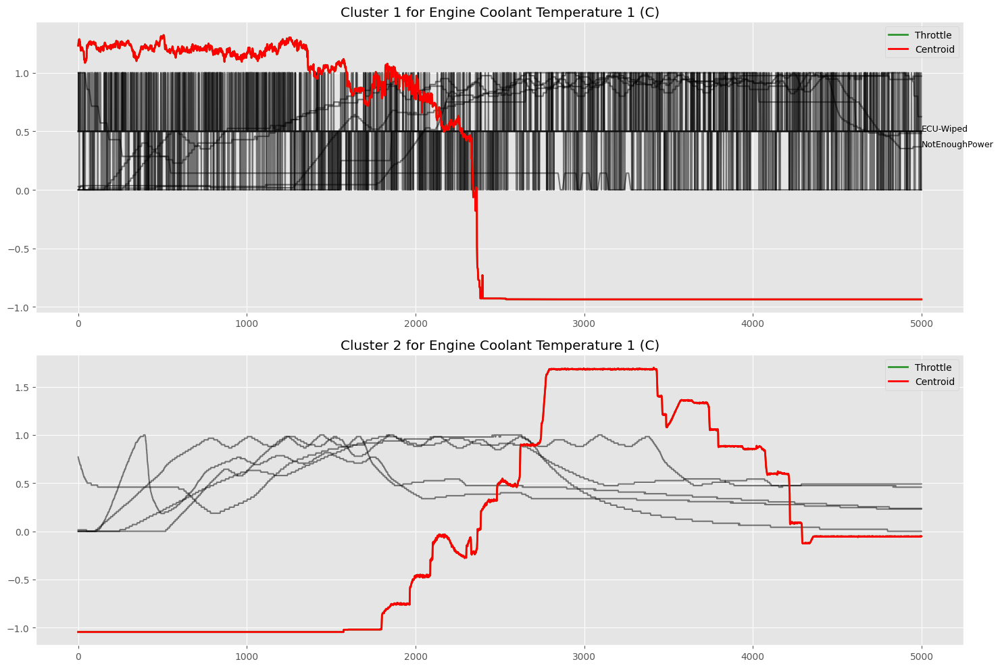

...

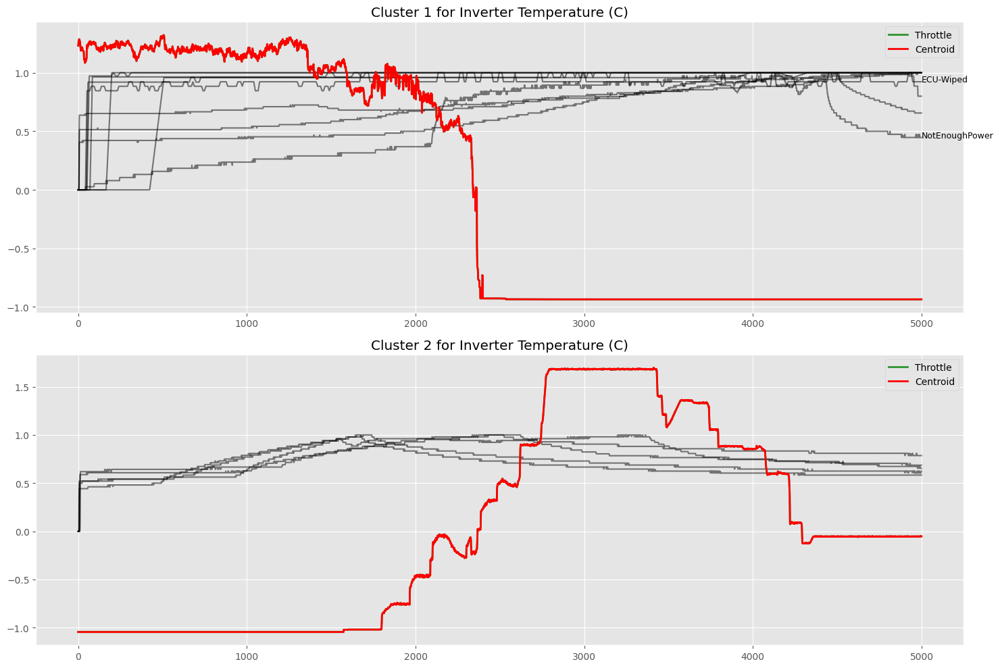

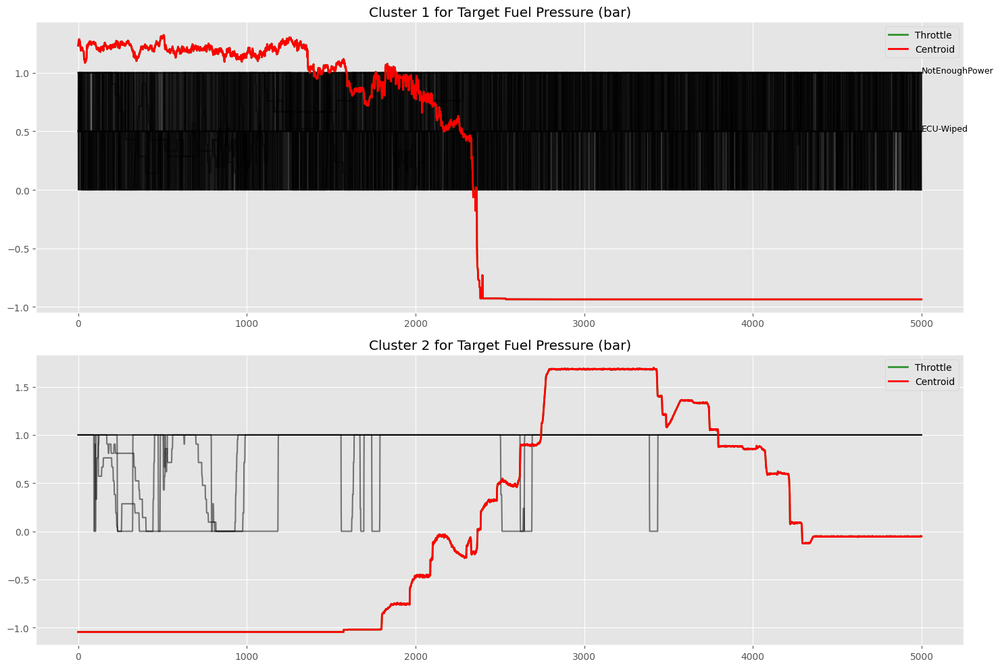

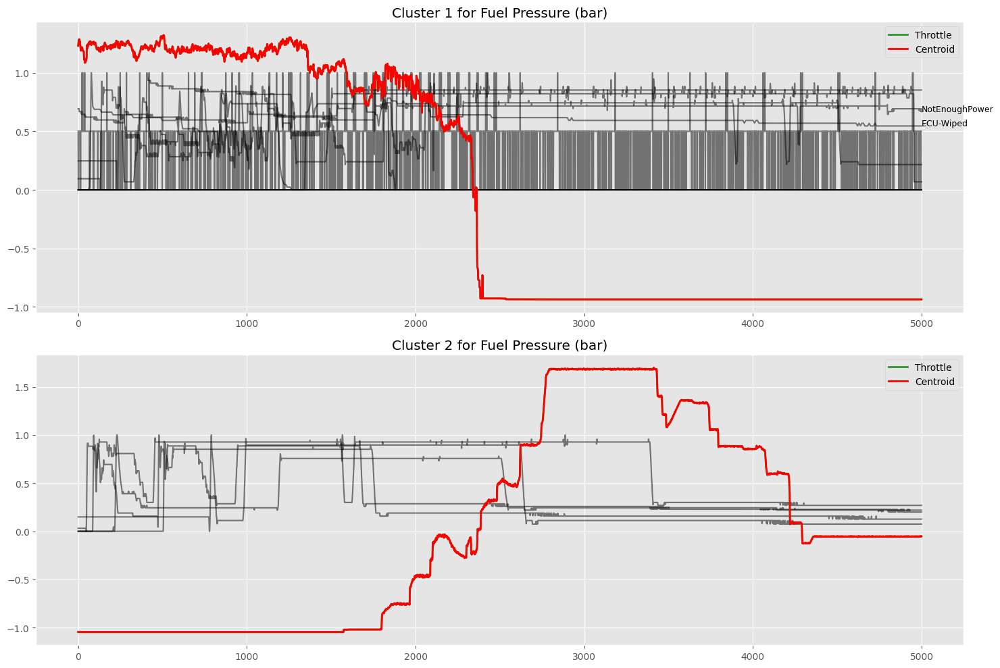

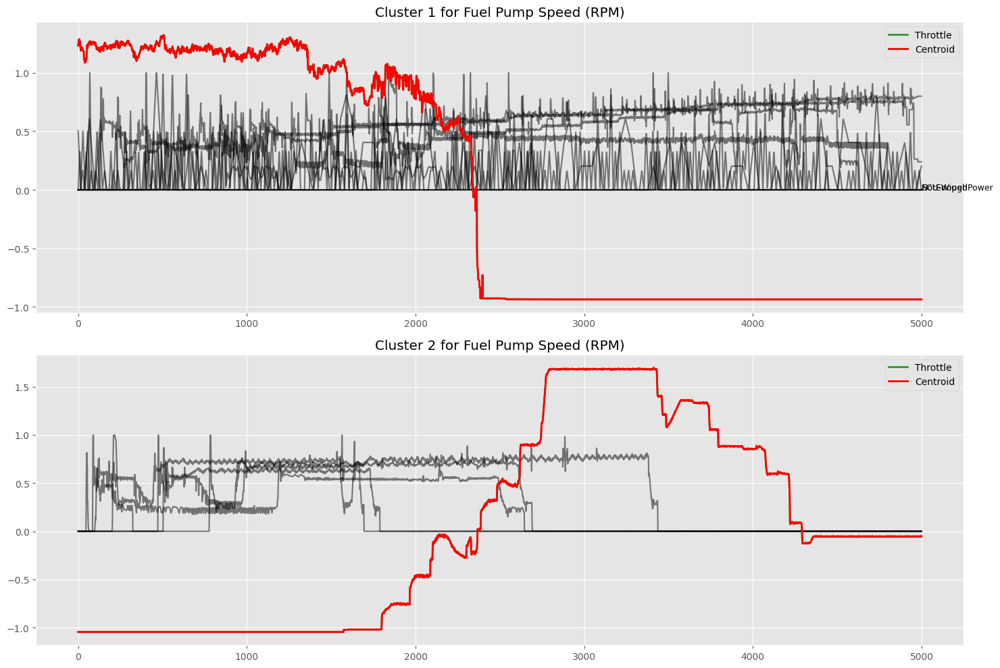

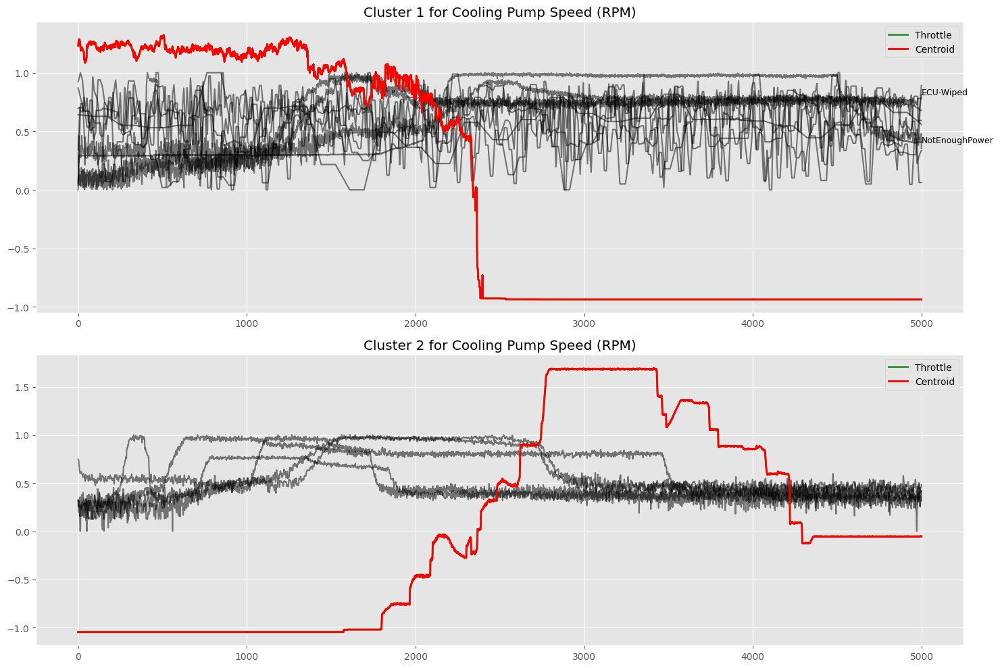

In [207]:
num_columns = X_scaled.shape[2]
for col in range(num_columns):
    plot_clusters_for_column(X_scaled, cluster_labels_kshape, 2, col, top_series_indices_kshape, model_kshape)

In [130]:
model_kernel_kmeans = KernelKMeans(n_clusters=n_clusters, kernel="gak", random_state=0)
model_kernel_kmeans.fit(X_scaled)

C:\Users\dhruv\anaconda3\envs\data_science\lib\site-packages\tslearn\metrics\softdtw_variants.py:341: RuntimeWarning: invalid value encountered in matmul
  return diagonal_left @ unnormalized_matrix @ diagonal_right


KernelKMeans(n_clusters=4, random_state=0)

In [131]:
with open('kernel_kmeans_model.pkl', 'wb') as f:
    pickle.dump(model_kernel_kmeans, f)

In [132]:
cluster_labels_kernel_kmeans = model_kernel_kmeans.labels_

In [133]:
# Reshape X for silhouette score calculation
X_reshaped = X_scaled.reshape(X.shape[0], -1)

# Compute the silhouette score for each sample
silhouette_vals_kernel_kmeans = silhouette_samples(X_reshaped, cluster_labels_kernel_kmeans)

# Compute the overall silhouette score
overall_silhouette_score_kernel_kmeans = silhouette_score(X_reshaped, cluster_labels_kernel_kmeans)
print(f'Overall Silhouette Score: {overall_silhouette_score_kernel_kmeans}')

ValueError: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

In [ ]:
top_series_indices_kernel_kmeans = get_top_series_per_cluster(X_scaled, cluster_labels_kernel_kmeans, silhouette_vals_kernel_kmeans, top_n=5)

In [ ]:
num_columns = X_scaled.shape[2]
for col in range(num_columns):
    plot_clusters_for_column(
        X_scaled, 
        cluster_labels_kernel_kmeans, 
        n_clusters, 
        col, 
        top_series_indices_kernel_kmeans, 
        model_kernel_kmeans
    )